In [3]:
using Plots

# Question 1

In [4]:
# constants 

ρ_a        = 1.225;        # density
cp_a     = 1005;         # Cp
V_a         = 2880;         # Volume
dt          = 15;           # Time step

E_f         = 200;          # constant heat exchange from fabric
E_int       = 50;           # constant internal load

T_init      = 293.15;       # initial temperature

time series

In [5]:
# time series, time step of dt = 15s, period of 24 hours, start and end at noon 
timing = range(0, 24*60*60, step = 15)  |> collect; # use collect to print out everything -> 24 hours * 60 mins * 60s

# timing = 0:dt:dt*4*60*24;  syntax in matlab, maybe because 4 15s intervals in a minute 

5761-element Vector{Int64}:
     0
    15
    30
    45
    60
    75
    90
   105
   120
   135
     ⋮
 86280
 86295
 86310
 86325
 86340
 86355
 86370
 86385
 86400

In [6]:
# alternative if every list entry stands for a 15 s interval --> this way wrong 
# timing15 = range[0, 24*4*60, step = 1) |> collect

natural ventilation 

In [7]:
E_v = zeros(length(timing))
# ventilation extracting 500W of energy from building from 7pm to 7am 


5761-element Vector{Float64}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

In [8]:
# index of 7pm 
night_seconds = 7*60*60 # value # starting at noon, so 7pm is 7, and 7am, 12 hours later is 19
morning_seconds = 19*60*60
# -> what index is this value?

68400

In [9]:
# E_v((timing/60/60) >= 7 & (timing/60/60) <= 19) = -500
ix = findall(x->night_seconds<=x<=morning_seconds,timing);
E_v[ix] .= -500;
setindex!(E_v, fill(-500, length(ix)), ix);

initialize initial air temp 

In [10]:
# internal temperature 
T_int = zeros(1, length(timing))
T_int[1] = T_init;

create time series 

In [11]:
for i in  1:length(timing)
    print(i)
end

1234567891011121314151617181920212223242526272829303132333435363738394041424344454647484950515253545556575859606162636465666768697071727374757677787980818283848586878889909192939495969798991001011021031041051061071081091101111121131141151161171181191201211221231241251261271281291301311321331341351361371381391401411421431441451461471481491501511521531541551561571581591601611621631641651661671681691701711721731741751761771781791801811821831841851861871881891901911921931941951961971981992002012022032042052062072082092102112122132142152162172182192202212222232242252262272282292302312322332342352362372382392402412422432442452462472482492502512522532542552562572582592602612622632642652662672682692702712722732742752762772782792802812822832842852862872882892902912922932942952962972982993003013023033043053063073083093103113123133143153163173183193203213223233243253263273283293303313323333343353363373383393403413423433443453463473483493503513523533543553563573583593603613623633643653663673683693

2839284028412842284328442845284628472848284928502851285228532854285528562857285828592860286128622863286428652866286728682869287028712872287328742875287628772878287928802881288228832884288528862887288828892890289128922893289428952896289728982899290029012902290329042905290629072908290929102911291229132914291529162917291829192920292129222923292429252926292729282929293029312932293329342935293629372938293929402941294229432944294529462947294829492950295129522953295429552956295729582959296029612962296329642965296629672968296929702971297229732974297529762977297829792980298129822983298429852986298729882989299029912992299329942995299629972998299930003001300230033004300530063007300830093010301130123013301430153016301730183019302030213022302330243025302630273028302930303031303230333034303530363037303830393040304130423043304430453046304730483049305030513052305330543055305630573058305930603061306230633064306530663067306830693070307130723073307430753076307730783079308030813082308330843085308630873088

5399540054015402540354045405540654075408540954105411541254135414541554165417541854195420542154225423542454255426542754285429543054315432543354345435543654375438543954405441544254435444544554465447544854495450545154525453545454555456545754585459546054615462546354645465546654675468546954705471547254735474547554765477547854795480548154825483548454855486548754885489549054915492549354945495549654975498549955005501550255035504550555065507550855095510551155125513551455155516551755185519552055215522552355245525552655275528552955305531553255335534553555365537553855395540554155425543554455455546554755485549555055515552555355545555555655575558555955605561556255635564556555665567556855695570557155725573557455755576557755785579558055815582558355845585558655875588558955905591559255935594559555965597559855995600560156025603560456055606560756085609561056115612561356145615561656175618561956205621562256235624562556265627562856295630563156325633563456355636563756385639564056415642564356445645564656475648

In [12]:
for i in 1:length(timing)-1
    # print(T_int[i+1])
    T_int[i+1] = T_int[i] + dt/(ρ_a * cp_a * V_a) * (E_f + E_int + E_v[i]);
    
end 

In [13]:
# T_int = map(i -> T_int[i] + dt/(ρ_a * cp_a * V_a) * (E_f + E_int + E_v[i]), 1:length(timing))

plot 

In [14]:
E_f*ones(length(timing));

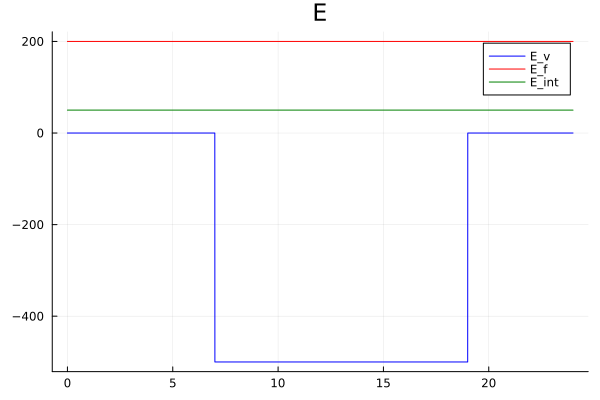

In [15]:
###
plot(timing/3600, E_v, label="E_v", linecolor="blue")
plot!(timing/3600, E_f*ones(length(timing)), label="E_f", linecolor="red")
plot!(timing/3600, E_int*ones(length(timing)), label="E_int", linecolor="green")
plot!(plot_title="E")

In [16]:
plot(timing/3600, T_int, lc="blue")
plot!(plot_title="T_int")

ErrorException: Expects 5761 elements in each col of y, found 1.

# Question Two 

In [17]:
using PlotlyJS

## Part A

### Parameters

In [18]:
rho_f = 2300; # fabric density   
cp_f = 750; # fabric specific heat      
k_f = 0.8;  #   fabric thermal conductivity 
A_f = 90;  # fabric area 
T_f = 293.15; # fabric temp 
dx = 0.01;    # delta x  
th = 0.1;  # thickness of the fabric     
dt = 15; # time step 
h = 4; # convection coefficient ??


In [19]:
alpha_f = k_f /(cp_f * rho_f); # thermal diffusivity 
lambda = alpha_f * dt / dx^2; # somehow Δt/Δx²

In [20]:
x = range(0, th, step = dx)  |> collect  # fabric, discretize in x direction 
# t =range(0, dt*4*60*24*4, step = dt) |> collect   # 
t= range(0, 4*24*60*60, step = 15)  |> collect # timing, in seconds but why times 4 -> 4 days vs 1?
T = zeros(length(x),length(t));  # Initialize temperature matrix, [11 * 23041] -> or [10 * 23040]
n = length(x);  

In [21]:
size(T)

(11, 23041)

In [22]:
# PlotlyJS.plot(t, mode="markers+lines")

## Part B

### initial conditions, internal temperature

In [23]:
# assumption for internal temperature
T_int = 295.65 .+ 2.5 * cos.(2*pi*(t/3600 .- 2)/24); # looks like a sinusoidal function

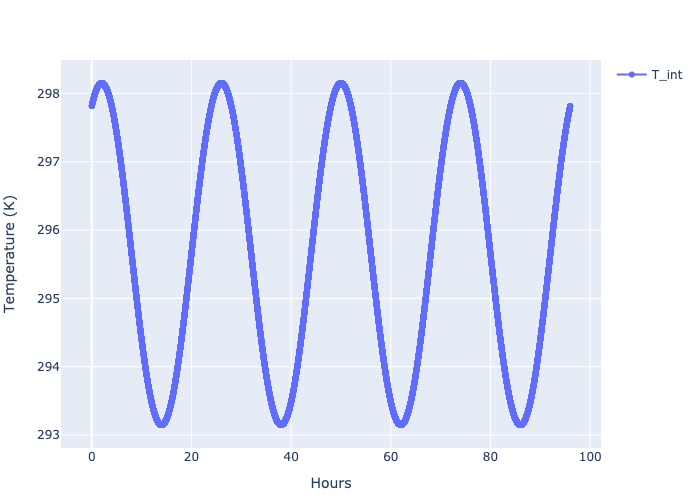

In [24]:
PlotlyJS.plot(t/3600, T_int, mode="markers+lines", name="T_int", Layout(showlegend=true, xaxis_title="Hours", yaxis_title="Temperature (K)" ),  config=PlotConfig(staticPlot=true))

In [25]:
# initial condition -> all temps along the 1D fabric are the same
T[:,1] .= T_f;
# T

11-element view(::Matrix{Float64}, :, 1) with eltype Float64:
 293.15
 293.15
 293.15
 293.15
 293.15
 293.15
 293.15
 293.15
 293.15
 293.15
 293.15

### build A matrix, B vector

In [26]:
# % Build matrix and boundary condition
# % initialize A matrix and B vector
# % T(t+1) = A * T(t) + B
A = zeros(n,n); # needs to be an nxn matrix... [11,11]
B = zeros(n,1); # [11,1]
beta =  h * dx / k_f; # 0.05

In [27]:
# build the A matrix based on central differencing scheme and change as explained on p. 4of hw6 solutions
for i=2:n-1
    A[i, i-1] = lambda;
    A[i, i] = 1-2*lambda;
    A[i, i+1] = lambda;
end

A[1,1] = 1-lambda-lambda*beta;  
A[1,2] = lambda;
A[n,n] = 1-lambda-lambda*beta;  
A[n,n-1] = lambda;



In [28]:
# show(IOContext(stdout, :limit=>false), MIME"text/plain"(), A)

### calculate temperature at each iteration

In [29]:
# for i=1:length(t)-1
for i=1:length(t)-1
    # B matrix is updated on every iteration with the value of T_internal at a given time 
    B[1] = lambda*beta*T_int[i];
    B[end] = lambda*beta*T_int[i];
    # the temperature matrix encapsulates the spatial central differencing of the A matrix, and the change in T_internal / "internal temp" trhough matrix B
    T[:,i+1] = A*T[:,i] + B;
    # B_t[:, i] = B
end

### check...

In [30]:
B[1]

1.0358737345500388

In [31]:
col = 30
A*T[:,col]

11-element Vector{Float64}:
 292.3816793667944
 293.2772213622654
 293.2021420892329
 293.1684413409886
 293.1559125190184
 293.1529280866775
 293.1559125190184
 293.1684413409887
 293.202142089233
 293.2772213622654
 292.38167936679434

In [32]:
A*T[:,col] +B

11×1 Matrix{Float64}:
 293.4175531013444
 293.2772213622654
 293.2021420892329
 293.1684413409886
 293.1559125190184
 293.1529280866775
 293.1559125190184
 293.1684413409887
 293.202142089233
 293.2772213622654
 293.41755310134437

### check via plot

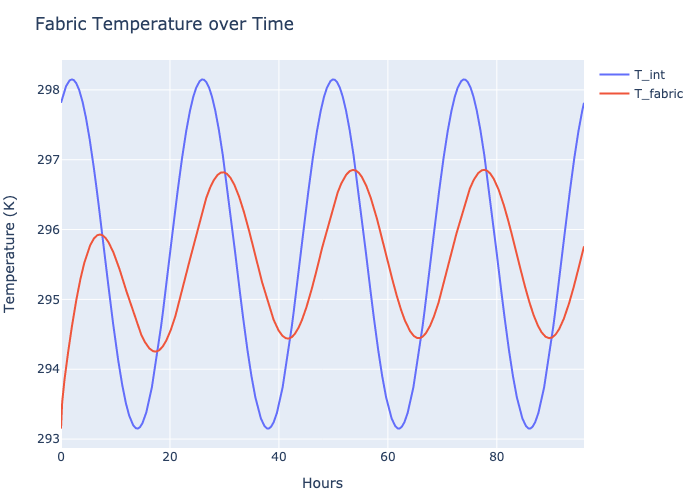

In [63]:
trace1 = PlotlyJS.scatter(x=t/3600, y=T_int, mode="lines", name="T_int")

trace2 = PlotlyJS.scatter(x=t/3600, y=T[1,:], mode="lines", name="T_fabric")

# .plot(t/3600, T_int, mode="lines", name="T_int", )
PlotlyJS.plot([trace1, trace2], Layout(;title="Fabric Temperature over Time", showlegend=true, xaxis_title="Hours", yaxis_title="Temperature (K)" ),  config=PlotConfig(scrollZoom=false))

In [58]:
time = ["'12 pm'", "'4 pm'", "'12 am'", "'4 am'", "'8 am'"];
traces = [PlotlyJS.scatter(x=x,  y=T[:, 1 + 4*60*4*i], mode="lines", name=label) for (i,label) in zip(1:5, time)];

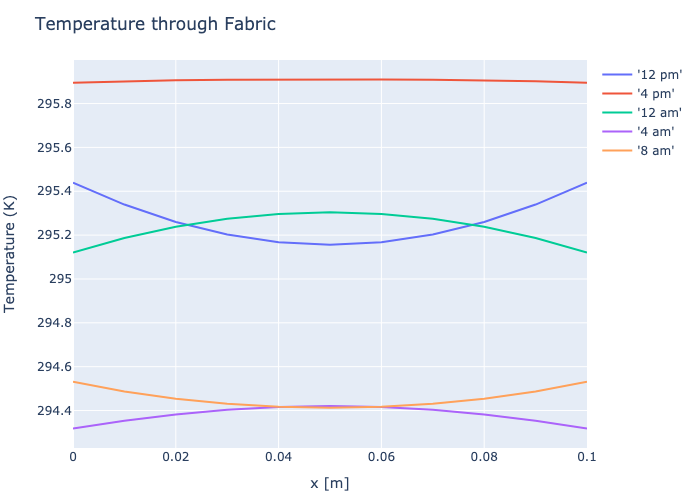

In [62]:
PlotlyJS.plot(traces, Layout(;title="Temperature through Fabric", showlegend=true, xaxis_title="x [m]", yaxis_title="Temperature (K)" ),  config=PlotConfig(scrollZoom=false))

### check via array